##### Steps for reading in dataset (following download), initial QC, dim reduction/clustering and saving out the myeloid cluster for **PRJNA907381**

Files were previously downloaded by Xiaohan for me, can be found in /QRISdata/Q6104/cellranger/out

Transferred the h5 file's from each sample to my rdm/scratch, these were all named: 

* filtered_feature_bc_matrix.h5

I added the prefix of the patient id to each: 

* SRR22490097_filtered_feature_bc_matrix.h5
* SRR22490098_filtered_feature_bc_matrix.h5
* SRR22490099_filtered_feature_bc_matrix.h5
* SRR22490100_filtered_feature_bc_matrix.h5
* SRR22490101_filtered_feature_bc_matrix.h5
* SRR22490102_filtered_feature_bc_matrix.h5
* SRR22490103_filtered_feature_bc_matrix.h5
* SRR22490104_filtered_feature_bc_matrix.h5

Dataset should contain 5 tumour affected (tumour involved, iLN) and 3 unaffected (uninvolved, uLN) LNs from melanoma (ie. 5 mets and 3 healthy), patient ID's correlate as follows (info found on PRJNA907381 listing):

* SRR22490097 --> Mel022-iLN
* SRR22490098 --> Mel018-uLN
* SRR22490099 --> Mel018-iLN
* SRR22490100 --> Mel014-uLN
* SRR22490101 --> Mel014-iLN
* SRR22490102 --> Mel009-iLN
* SRR22490103 --> Mel002-uLN
* SRR22490104 --> Mel002-iLN


In [1]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/PRJNA907381')
getwd()

[1] "/scratch/user/s4436039"

[1] "/scratch/user/s4436039/scdata/PRJNA907381"

In [2]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [3]:
library(hdf5r)

In [4]:
#load all datasets
MEL022_iLN.data <- Read10X_h5("SRR22490097_filtered_feature_bc_matrix.h5")
MEL018_uLN.data <- Read10X_h5("SRR22490098_filtered_feature_bc_matrix.h5")
MEL018_iLN.data <- Read10X_h5("SRR22490099_filtered_feature_bc_matrix.h5")
MEL014_uLN.data <- Read10X_h5("SRR22490100_filtered_feature_bc_matrix.h5")
MEL014_iLN.data <- Read10X_h5("SRR22490101_filtered_feature_bc_matrix.h5")
MEL009_iLN.data <- Read10X_h5("SRR22490102_filtered_feature_bc_matrix.h5")
MEL002_uLN.data <- Read10X_h5("SRR22490103_filtered_feature_bc_matrix.h5")
MEL002_iLN.data <- Read10X_h5("SRR22490104_filtered_feature_bc_matrix.h5")

In [5]:
head(colnames(MEL022_iLN.data))
head(colnames(MEL014_iLN.data))
head(colnames(MEL002_uLN.data))

[1] "AAACCCAAGAAGCTGC-1" "AAACCCAAGCCAAGCA-1" "AAACCCAAGCTCCACG-1"
[4] "AAACCCAAGTGGCAGT-1" "AAACCCACACTTTATC-1" "AAACCCACAGCGTATT-1"

[1] "AAACCCAAGTTGAAAC-1" "AAACGAATCTACTGAG-1" "AAACGCTAGCGGTAGT-1"
[4] "AAACGCTTCCTTGAAG-1" "AAAGAACCAAACACGG-1" "AAAGGGCTCCCGTGAG-1"

[1] "AAACCCATCCTCTAAT-1" "AAACGCTTCCGCGGAT-1" "AAAGAACCATTCCTCG-1"
[4] "AAAGGGCAGGCCTTGC-1" "AAAGGGCTCCTAGCCT-1" "AAAGGTATCCTGTTAT-1"

In [6]:
#Add dataset info to colnames
colnames(MEL022_iLN.data) <- paste0("PRJNA907381_MEL022_iLN_", colnames(MEL022_iLN.data))
colnames(MEL018_uLN.data) <- paste0("PRJNA907381_MEL018_uLN_", colnames(MEL018_uLN.data))
colnames(MEL018_iLN.data) <- paste0("PRJNA907381_MEL018_iLN_", colnames(MEL018_iLN.data))
colnames(MEL014_uLN.data) <- paste0("PRJNA907381_MEL014_uLN_", colnames(MEL014_uLN.data))
colnames(MEL014_iLN.data) <- paste0("PRJNA907381_MEL014_iLN_", colnames(MEL014_iLN.data))
colnames(MEL009_iLN.data) <- paste0("PRJNA907381_MEL009_iLN_", colnames(MEL009_iLN.data))
colnames(MEL002_uLN.data) <- paste0("PRJNA907381_MEL002_uLN_", colnames(MEL002_uLN.data))
colnames(MEL002_iLN.data) <- paste0("PRJNA907381_MEL002_iLN_", colnames(MEL002_iLN.data))

In [7]:
head(colnames(MEL022_iLN.data))
head(colnames(MEL014_iLN.data))
head(colnames(MEL002_uLN.data))

[1] "PRJNA907381_MEL022_iLN_AAACCCAAGAAGCTGC-1"
[2] "PRJNA907381_MEL022_iLN_AAACCCAAGCCAAGCA-1"
[3] "PRJNA907381_MEL022_iLN_AAACCCAAGCTCCACG-1"
[4] "PRJNA907381_MEL022_iLN_AAACCCAAGTGGCAGT-1"
[5] "PRJNA907381_MEL022_iLN_AAACCCACACTTTATC-1"
[6] "PRJNA907381_MEL022_iLN_AAACCCACAGCGTATT-1"

[1] "PRJNA907381_MEL014_iLN_AAACCCAAGTTGAAAC-1"
[2] "PRJNA907381_MEL014_iLN_AAACGAATCTACTGAG-1"
[3] "PRJNA907381_MEL014_iLN_AAACGCTAGCGGTAGT-1"
[4] "PRJNA907381_MEL014_iLN_AAACGCTTCCTTGAAG-1"
[5] "PRJNA907381_MEL014_iLN_AAAGAACCAAACACGG-1"
[6] "PRJNA907381_MEL014_iLN_AAAGGGCTCCCGTGAG-1"

[1] "PRJNA907381_MEL002_uLN_AAACCCATCCTCTAAT-1"
[2] "PRJNA907381_MEL002_uLN_AAACGCTTCCGCGGAT-1"
[3] "PRJNA907381_MEL002_uLN_AAAGAACCATTCCTCG-1"
[4] "PRJNA907381_MEL002_uLN_AAAGGGCAGGCCTTGC-1"
[5] "PRJNA907381_MEL002_uLN_AAAGGGCTCCTAGCCT-1"
[6] "PRJNA907381_MEL002_uLN_AAAGGTATCCTGTTAT-1"

In [8]:
#create seperate seurat object for each sample
MEL022_iLN <- CreateSeuratObject(counts = MEL022_iLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL022_iLN@meta.data$sample_type <- "LN mets"
MEL022_iLN@meta.data$cancer_type <- "Metastatic Melanoma"
MEL022_iLN@meta.data$patient_id <- "MEL022"
MEL022_iLN@meta.data$sample_id <- "PRJNA907381_MEL022_iLN"

In [9]:
#create seperate seurat object for each sample
MEL018_iLN <- CreateSeuratObject(counts = MEL018_iLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL018_iLN@meta.data$sample_type <- "LN mets"
MEL018_iLN@meta.data$cancer_type <- "Metastatic Melanoma"
MEL018_iLN@meta.data$patient_id <- "MEL018"
MEL018_iLN@meta.data$sample_id <- "PRJNA907381_MEL018_iLN"

In [10]:
#create seperate seurat object for each sample
MEL014_iLN <- CreateSeuratObject(counts = MEL014_iLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL014_iLN@meta.data$sample_type <- "LN mets"
MEL014_iLN@meta.data$cancer_type <- "Metastatic Melanoma"
MEL014_iLN@meta.data$patient_id <- "MEL014"
MEL014_iLN@meta.data$sample_id <- "PRJNA907381_MEL014_iLN"

In [11]:
#create seperate seurat object for each sample
MEL009_iLN <- CreateSeuratObject(counts = MEL009_iLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL009_iLN@meta.data$sample_type <- "LN mets"
MEL009_iLN@meta.data$cancer_type <- "Metastatic Melanoma"
MEL009_iLN@meta.data$patient_id <- "MEL009"
MEL009_iLN@meta.data$sample_id <- "PRJNA907381_MEL009_iLN"

In [12]:
#create seperate seurat object for each sample
MEL002_iLN <- CreateSeuratObject(counts = MEL002_iLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL002_iLN@meta.data$sample_type <- "LN mets"
MEL002_iLN@meta.data$cancer_type <- "Metastatic Melanoma"
MEL002_iLN@meta.data$patient_id <- "MEL002"
MEL002_iLN@meta.data$sample_id <- "PRJNA907381_MEL002_iLN"

In [13]:
#create seperate seurat object for each sample
MEL018_uLN <- CreateSeuratObject(counts = MEL018_uLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL018_uLN@meta.data$sample_type <- "uninvolved LN"
MEL018_uLN@meta.data$cancer_type <- "Healthy"
MEL018_uLN@meta.data$patient_id <- "MEL018"
MEL018_uLN@meta.data$sample_id <- "PRJNA907381_MEL018_uLN"

In [14]:
#create seperate seurat object for each sample
MEL014_uLN <- CreateSeuratObject(counts = MEL014_uLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL014_uLN@meta.data$sample_type <- "uninvolved LN"
MEL014_uLN@meta.data$cancer_type <- "Healthy"
MEL014_uLN@meta.data$patient_id <- "MEL014"
MEL014_uLN@meta.data$sample_id <- "PRJNA907381_MEL014_uLN"

In [15]:
#create seperate seurat object for each sample
MEL002_uLN <- CreateSeuratObject(counts = MEL002_uLN.data, project = "PRJNA907381", min.features = 200)
#add metadata to sample
MEL002_uLN@meta.data$sample_type <- "uninvolved LN"
MEL002_uLN@meta.data$cancer_type <- "Healthy"
MEL002_uLN@meta.data$patient_id <- "MEL002"
MEL002_uLN@meta.data$sample_id <- "PRJNA907381_MEL002_uLN"

In [17]:
head(MEL022_iLN@meta.data) 
head(MEL014_uLN@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
PRJNA907381_MEL022_iLN_AAACCCAAGAAGCTGC-1,PRJNA907381,5669,2148,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGCCAAGCA-1,PRJNA907381,8226,2412,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGCTCCACG-1,PRJNA907381,5645,2403,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGTGGCAGT-1,PRJNA907381,6102,2469,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCACACTTTATC-1,PRJNA907381,4328,1771,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCACAGCGTATT-1,PRJNA907381,12226,3481,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
PRJNA907381_MEL014_uLN_AAACCCACATCAGCTA-1,PRJNA907381,1297,614,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN
PRJNA907381_MEL014_uLN_AAACCCATCAGCACCG-1,PRJNA907381,4046,1863,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN
PRJNA907381_MEL014_uLN_AAACGAAAGAATTCAG-1,PRJNA907381,4181,1868,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN
PRJNA907381_MEL014_uLN_AAACGCTTCCTTGAAG-1,PRJNA907381,696,418,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN
PRJNA907381_MEL014_uLN_AAAGGGCTCACTGCTC-1,PRJNA907381,2833,1272,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN
PRJNA907381_MEL014_uLN_AACAAAGCAAGTTGGG-1,PRJNA907381,2852,1202,uninvolved LN,Healthy,MEL014,PRJNA907381_MEL014_uLN


In [18]:
#Merge seurat objects
MEL <- merge(MEL022_iLN, y = c(MEL018_uLN, MEL018_iLN, MEL014_uLN, MEL014_iLN, MEL009_iLN, MEL002_uLN, MEL002_iLN), project = "PRJNA907381")

In [19]:
MEL
head(MEL@meta.data)
tail(MEL@meta.data)

An object of class Seurat 
36601 features across 33998 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)
 8 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
PRJNA907381_MEL022_iLN_AAACCCAAGAAGCTGC-1,PRJNA907381,5669,2148,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGCCAAGCA-1,PRJNA907381,8226,2412,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGCTCCACG-1,PRJNA907381,5645,2403,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCAAGTGGCAGT-1,PRJNA907381,6102,2469,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCACACTTTATC-1,PRJNA907381,4328,1771,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN
PRJNA907381_MEL022_iLN_AAACCCACAGCGTATT-1,PRJNA907381,12226,3481,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
PRJNA907381_MEL002_iLN_TTGTTGTTCGTTCATT-1,PRJNA907381,621,420,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN
PRJNA907381_MEL002_iLN_TTTACCACAGTTACCA-1,PRJNA907381,12773,3066,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN
PRJNA907381_MEL002_iLN_TTTCCTCGTGATGTAA-1,PRJNA907381,7844,2137,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN
PRJNA907381_MEL002_iLN_TTTGACTCAGTTGTCA-1,PRJNA907381,18148,3162,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN
PRJNA907381_MEL002_iLN_TTTGGAGAGCCACAAG-1,PRJNA907381,10921,3208,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN
PRJNA907381_MEL002_iLN_TTTGGTTCACAAGTGG-1,PRJNA907381,8952,2467,LN mets,Metastatic Melanoma,MEL002,PRJNA907381_MEL002_iLN


Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


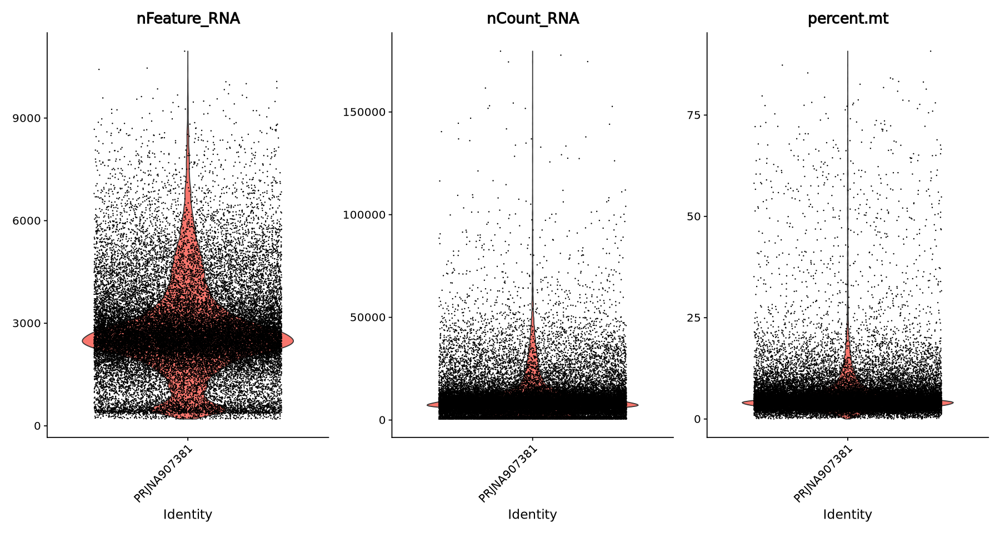

In [20]:
#QC Steps 
MEL[["percent.mt"]] <- PercentageFeatureSet(MEL, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(MEL, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [21]:
#Normalise the data
MEL <- NormalizeData(MEL)

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Normalizing layer: counts.7

Normalizing layer: counts.8



In [22]:
#Find variable features
MEL <- FindVariableFeatures(MEL, selection.method = "vst", nfeatures = 2000)

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Finding variable features for layer counts.7

Finding variable features for layer counts.8



In [23]:
#Scale the data
MEL <- ScaleData(MEL, vars.to.regress = c("percent.mt", "nCount_RNA"))

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix



In [24]:
#Run PCA
MEL <- RunPCA(MEL, features = VariableFeatures(object = MEL))

PC_ 1 
Positive:  PLAUR, LYZ, CST3, CSF2RA, TYROBP, PLXDC2, LRMDA, SLC8A1, FCER1G, ITGAX 
	   EPB41L3, FNIP2, IFI30, IL1B, FGL2, SERPINA1, RBM47, AC020656.1, PID1, CLEC7A 
	   AIF1, CPVL, IER3, C15orf48, VEGFA, C5AR1, TIMP1, FCGR2A, G0S2, MCTP1 
Negative:  SYNE2, BICDL1, CD3D, BCL11B, TRAC, IL32, CBLB, TRBC2, CD2, CD3E 
	   HMGB2, CD247, PRKCH, CD3G, TOX, ITK, FYN, CD96, CCL5, PDE3B 
	   ITM2A, TIGIT, CD27, PRKCQ, HMGB1, HIST1H4C, GZMA, CD8A, PCLAF, MKI67 
PC_ 2 
Positive:  HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, IRF8, IGHM, HLA-DRB1, HLA-DPB1, TCF4, FCHSD2 
	   SNED1, SEL1L3, BASP1, LARGE1, CCSER1, COL19A1, LINC01781, CLIC4, POU2AF1, TBC1D9 
	   PLAC8, TMEM163, AL592429.2, HDAC9, IGKC, TEX9, KCNH8, SSBP2, LRRK1, RHEX 
Negative:  FYN, PRKCH, BCL11B, TNFAIP3, CD2, IL32, CD3D, CST7, CD247, FYB1 
	   CCL5, ITK, CD3E, PDE3B, PTPRJ, SRGN, BICDL1, PRKCQ, PITPNC1, CBLB 
	   TRAC, HNRNPLL, CD3G, AOAH, CYTOR, GZMA, ID2, INPP4B, IQGAP2, CD8A 
PC_ 3 
Positive:  MKI67, STMN1, PCLAF, SHCBP1, RRM2, T

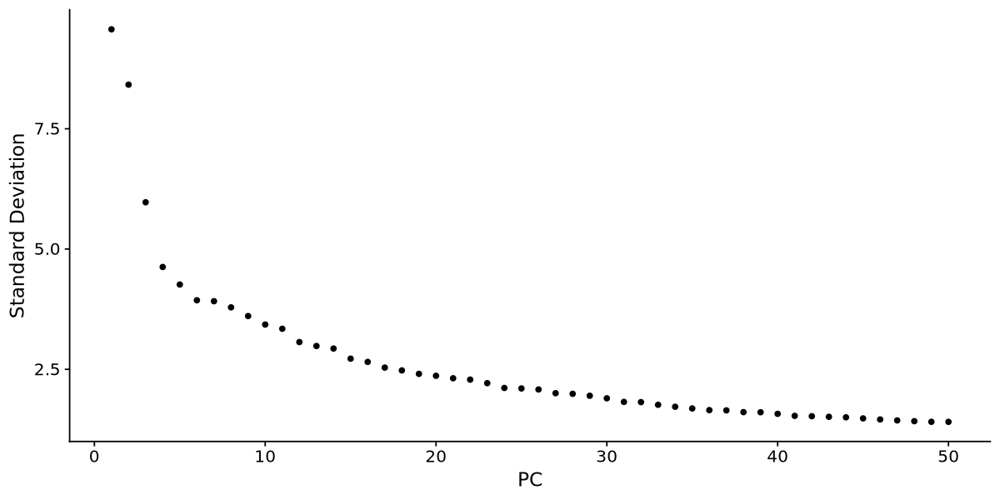

In [25]:
#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(MEL, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

In [26]:
#Find neighbours (make sure number matches no. features chosen above)
MEL <- FindNeighbors(MEL, dims = 1:40)

Computing nearest neighbor graph

Computing SNN



In [27]:
#Run UMAP
MEL <- RunUMAP(MEL, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


10:12:08 UMAP embedding parameters a = 0.9922 b = 1.112

10:12:08 Read 33998 rows and found 40 numeric columns

10:12:08 Using Annoy for neighbor search, n_neighbors = 30

10:12:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:12:11 Writing NN index file to temp file /scratch/temp/9674744/RtmpIO12g4/file364fea40236af4

10:12:11 Searching Annoy index using 1 thread, search_k = 3000

10:12:19 Annoy recall = 100%

10:12:19 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:12:20 Initializing from normalized Laplacian + noise (using RSpectra)

10:12:22 Commencing optimization for 200 epochs, with 1498948 positive edges

10:12:34 Optimization finished



In [28]:
#Cluster, resolution here set to 0.2
MEL <- FindClusters(MEL, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33998
Number of edges: 1260015

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9611
Number of communities: 17
Elapsed time: 4 seconds


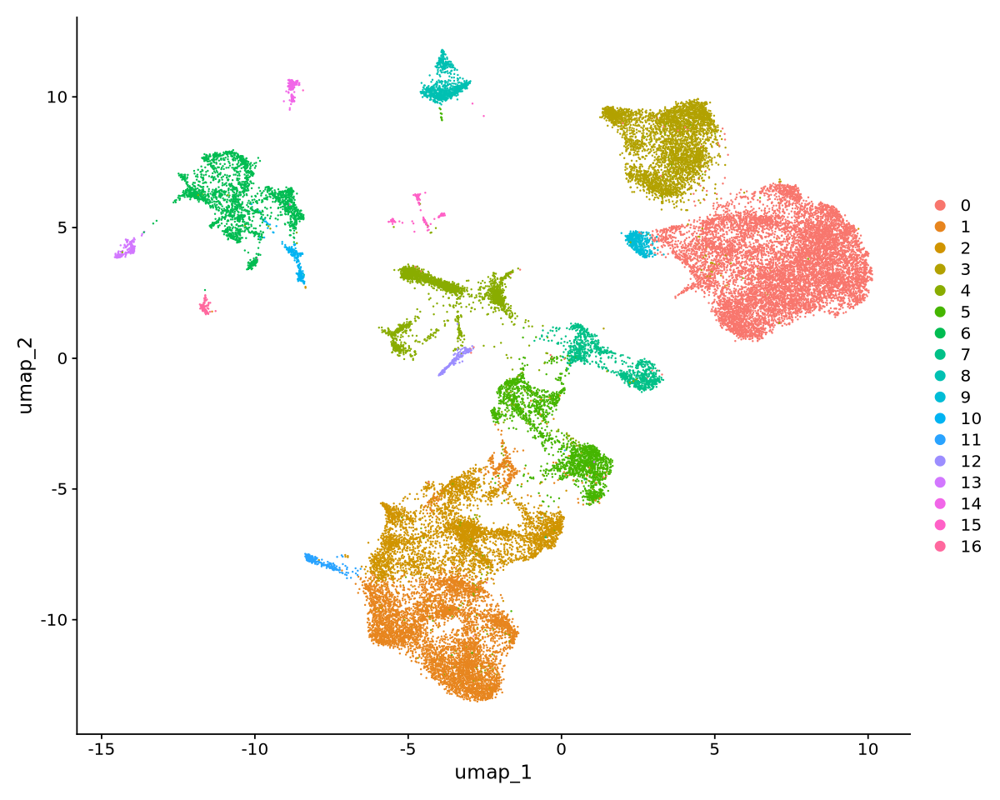

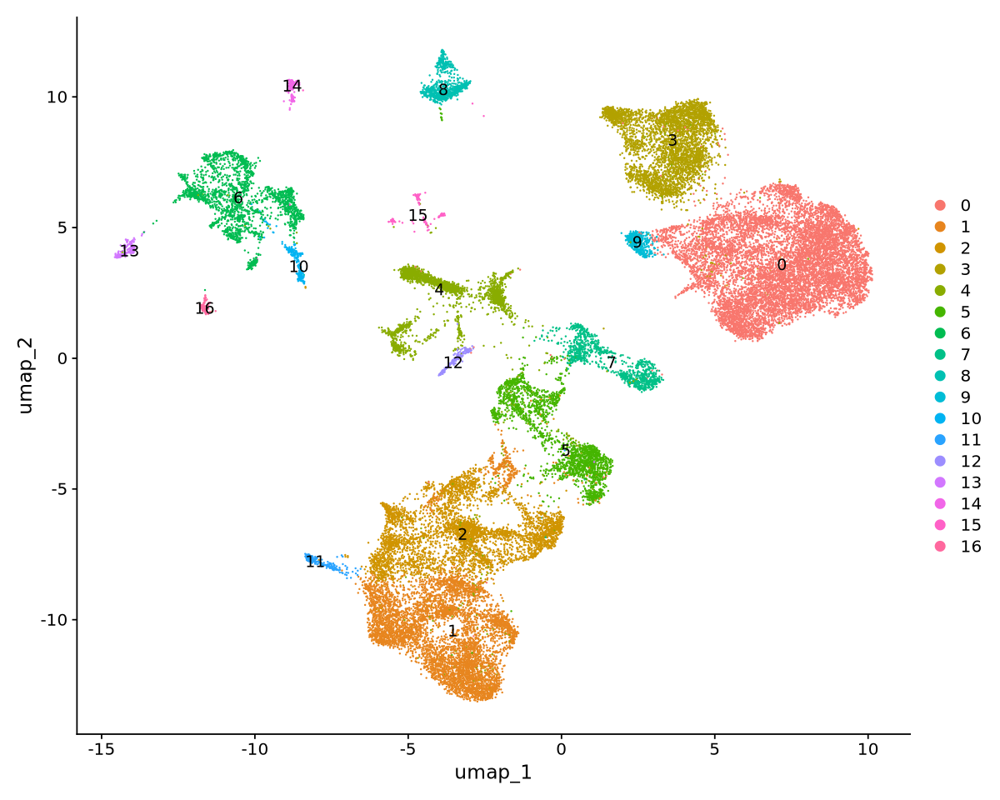

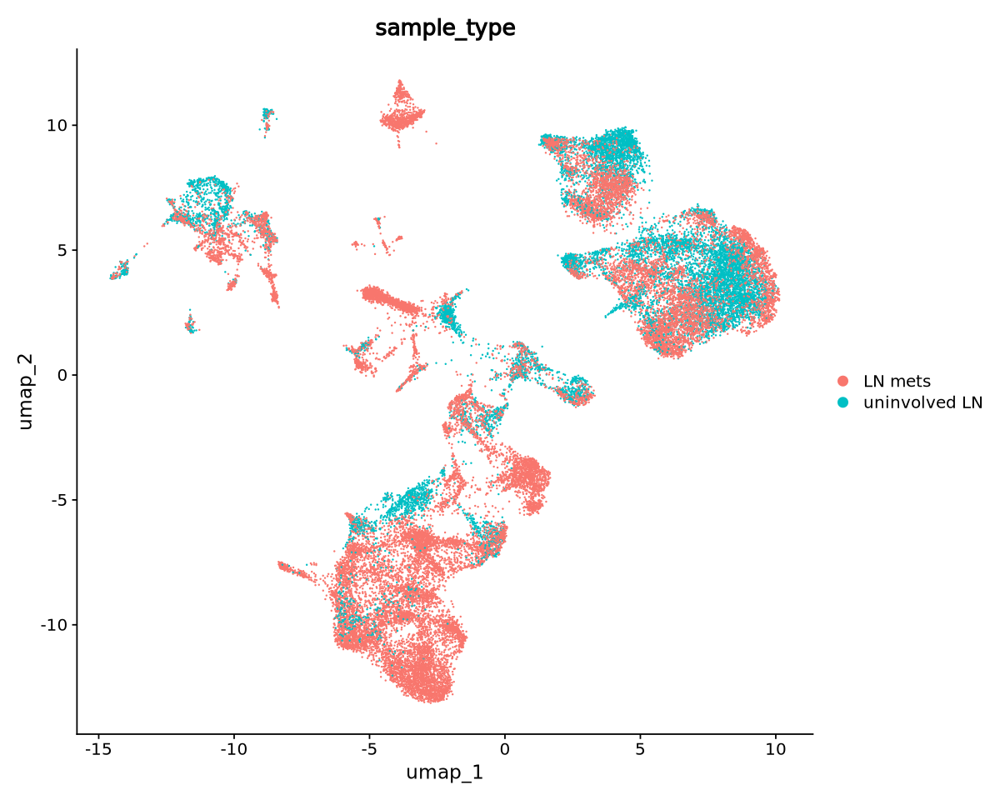

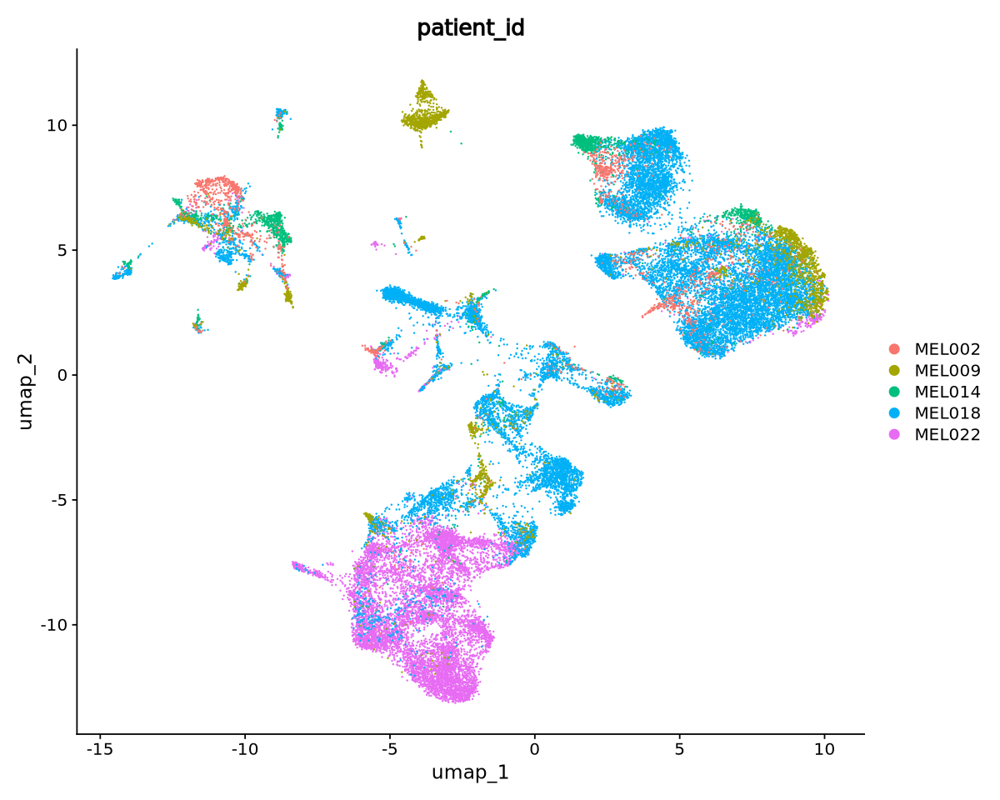

In [29]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(MEL, reduction = "umap")
DimPlot(MEL, reduction = "umap", label=TRUE)
DimPlot(MEL, reduction = "umap", group = "sample_type")
DimPlot(MEL, reduction = "umap", group = "patient_id")

In [30]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(MEL, file = "/scratch/user/s4436039/scdata/PRJNA907381/PRJNA907381.RDS")

In [4]:
MEL <- readRDS(file = "/scratch/user/s4436039/scdata/PRJNA907381/PRJNA907381.RDS")

### Below I was testing things for Liam

In [6]:
MEL_tu <- subset(MEL, subset = sample_type %in% c("LN mets"))

In [7]:
MEL
MEL_tu

An object of class Seurat 
36601 features across 33998 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 17 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
36601 features across 21972 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 11 layers present: counts.1, counts.3, counts.5, counts.6, counts.8, data.1, data.3, data.5, data.6, data.8, scale.data
 2 dimensional reductions calculated: pca, umap

In [ ]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(MEL, reduction = "umap", label=TRUE)

options(repr.plot.height=35, repr.plot.width=25)
FeaturePlot(MEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

FeaturePlot(MEL, features = c("CD3D", "CD4", "CD8A", "TIGIT", "CD226"), order = TRUE)


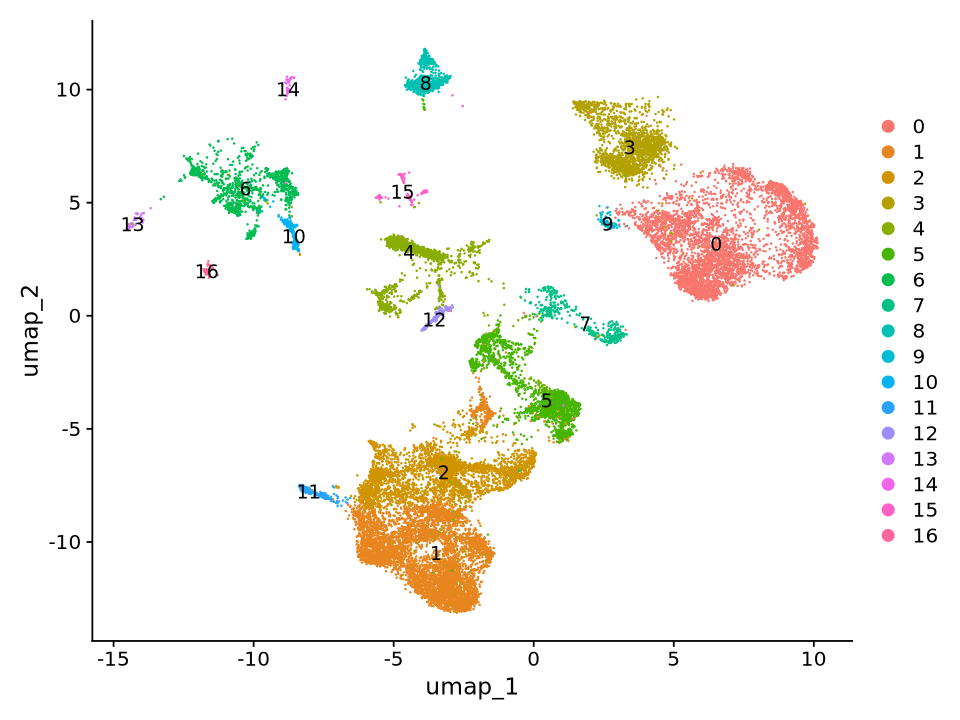

In [25]:
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(MEL_tu, reduction = "umap", label=TRUE)

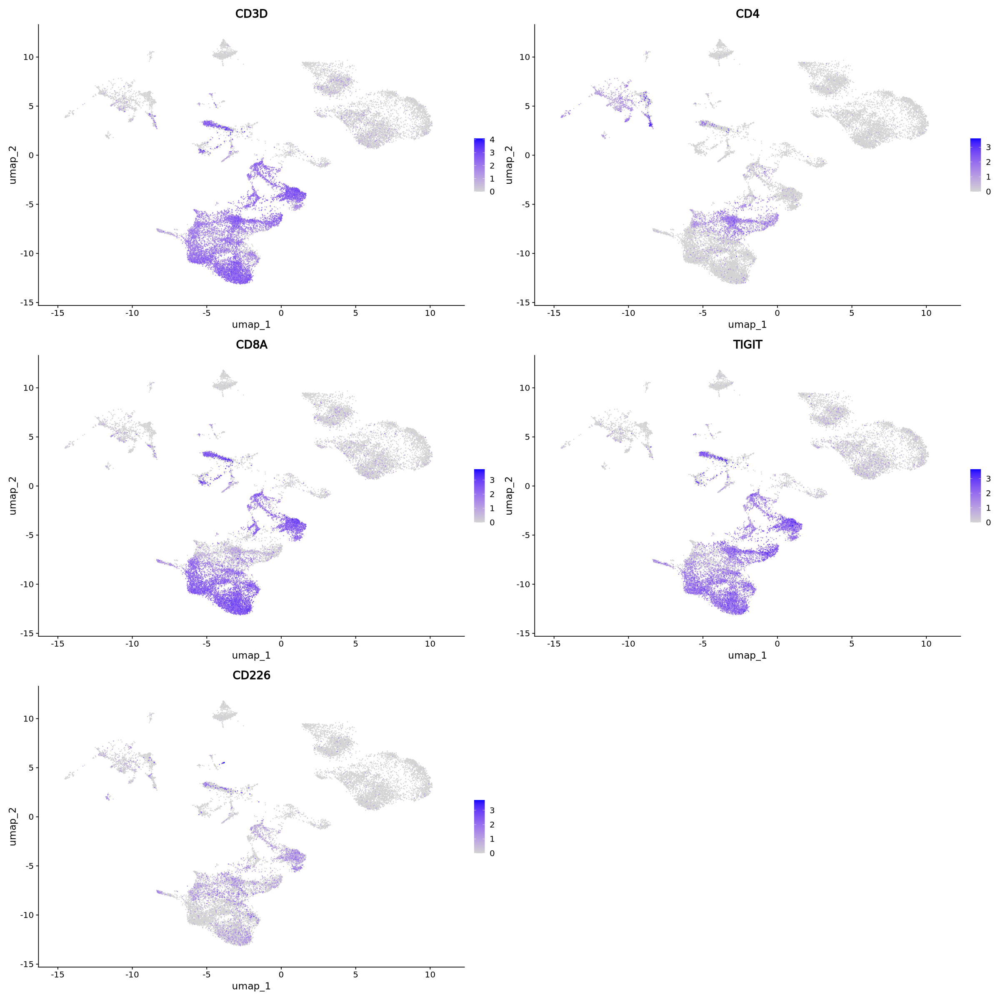

In [13]:
options(repr.plot.height=20, repr.plot.width=20)
FeaturePlot(MEL_tu, features = c("CD3D", "CD4", "CD8A", "TIGIT", "CD226"), order = TRUE)

Picking joint bandwidth of 0.0396

Picking joint bandwidth of 0.0251



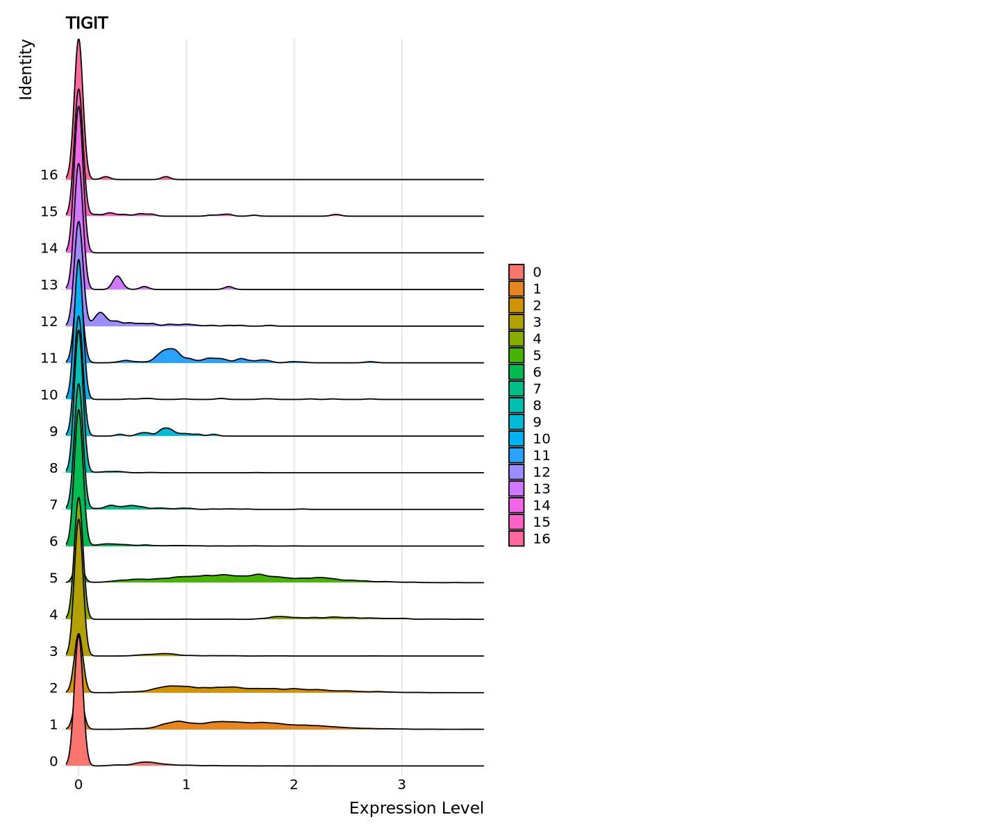

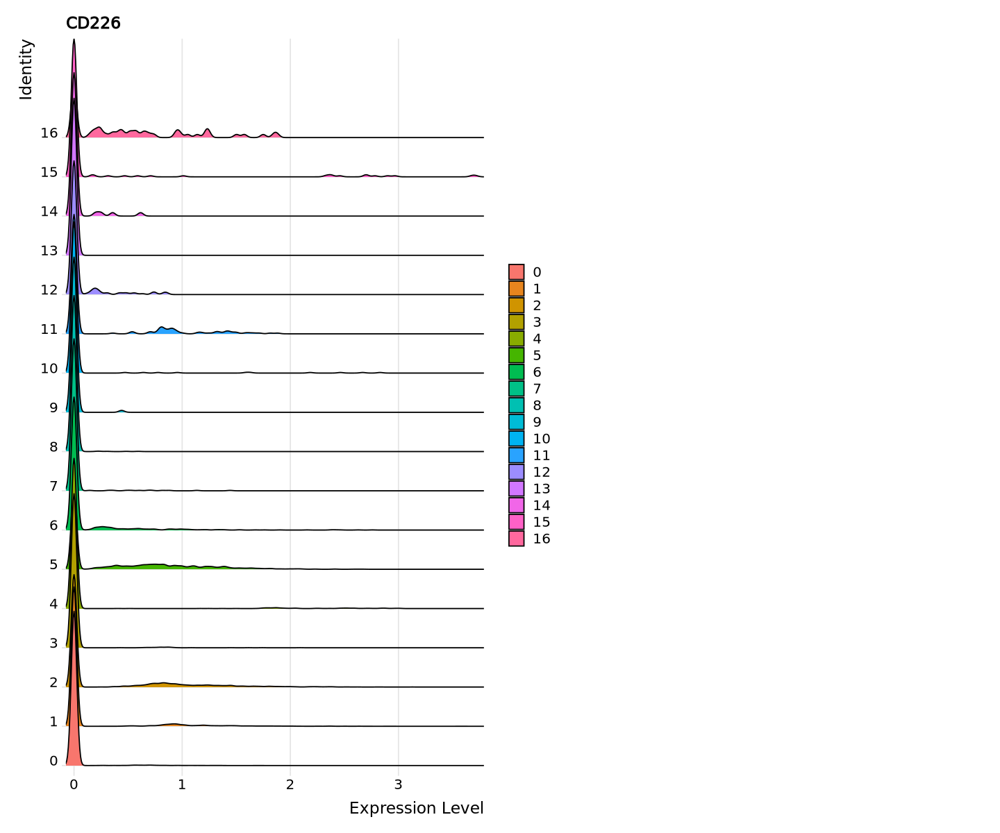

In [17]:
options(repr.plot.height=10, repr.plot.width=12)
RidgePlot(MEL_tu, features = "TIGIT", ncol = 2)
RidgePlot(MEL_tu, features = "CD226", ncol = 2)

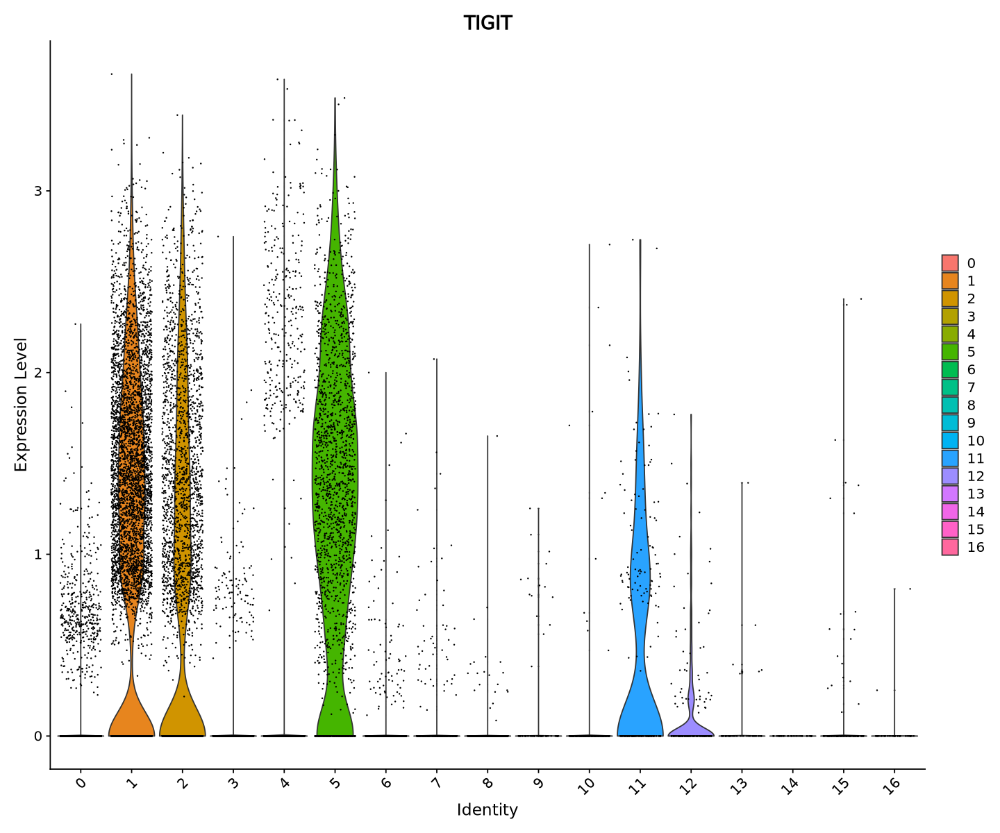

In [18]:
VlnPlot(MEL_tu, features = "TIGIT")

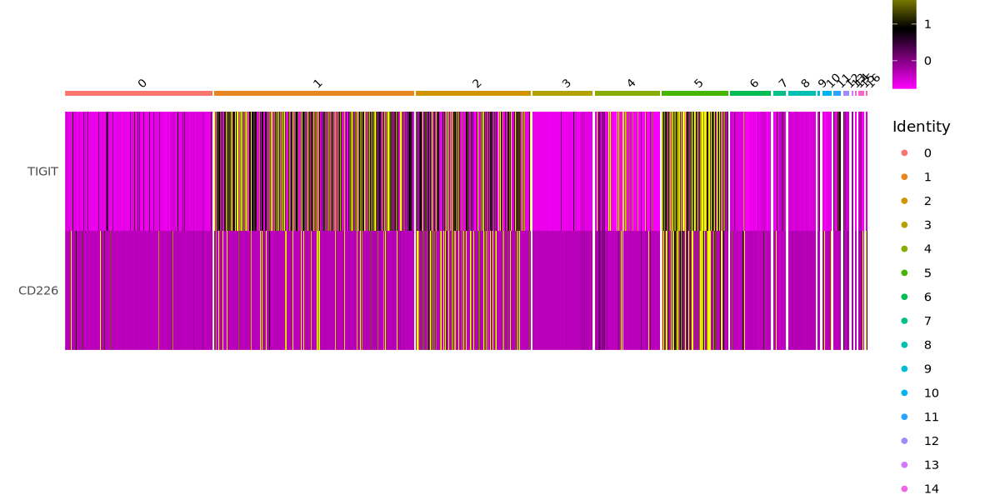

In [23]:
options(repr.plot.height=5, repr.plot.width=10)
DoHeatmap(MEL_tu, features = c("TIGIT","CD226"), size = 3)

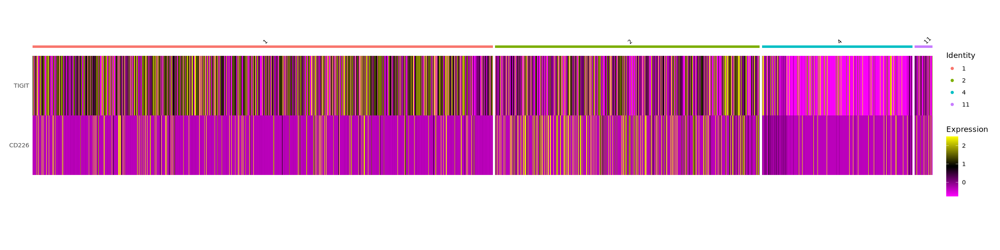

In [29]:
options(repr.plot.height=5, repr.plot.width=20)
DoHeatmap(MEL_tu_T, features = c("TIGIT","CD226"), size = 3)

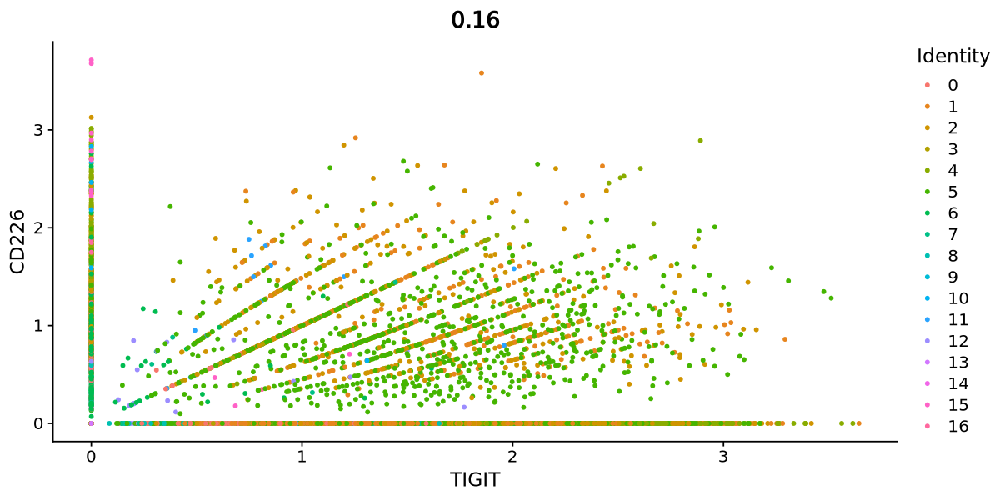

In [24]:
FeatureScatter(MEL_tu, feature1 = "TIGIT", feature2 = "CD226")

In [26]:
MEL_tu_T <- subset(MEL_tu, subset = RNA_snn_res.0.2 %in% c("1","2","11","4"))

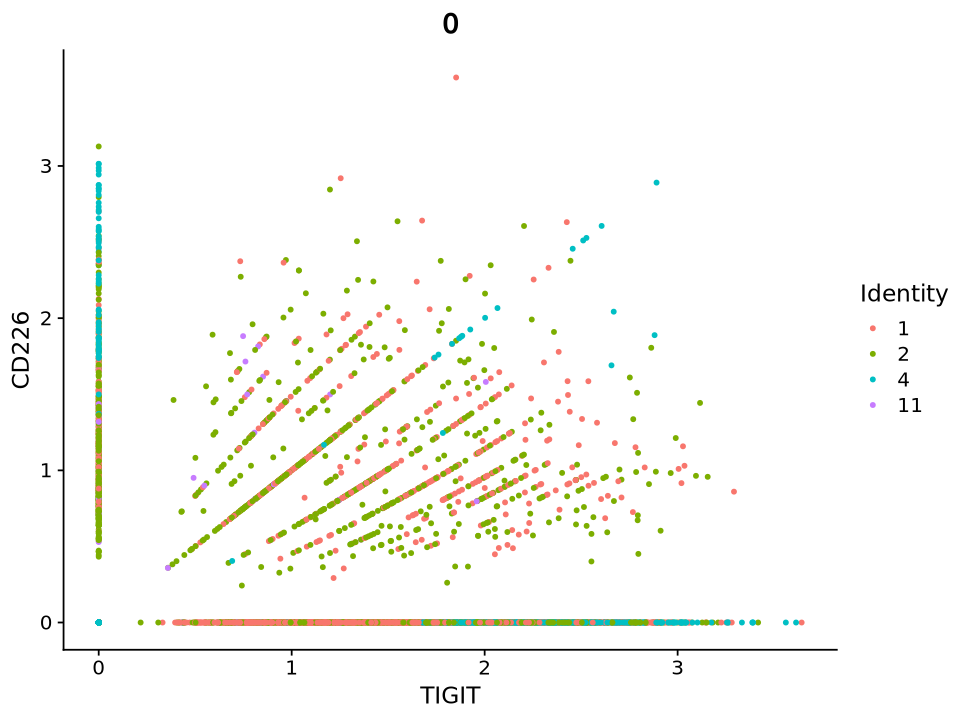

In [27]:
FeatureScatter(MEL_tu_T, feature1 = "TIGIT", feature2 = "CD226")

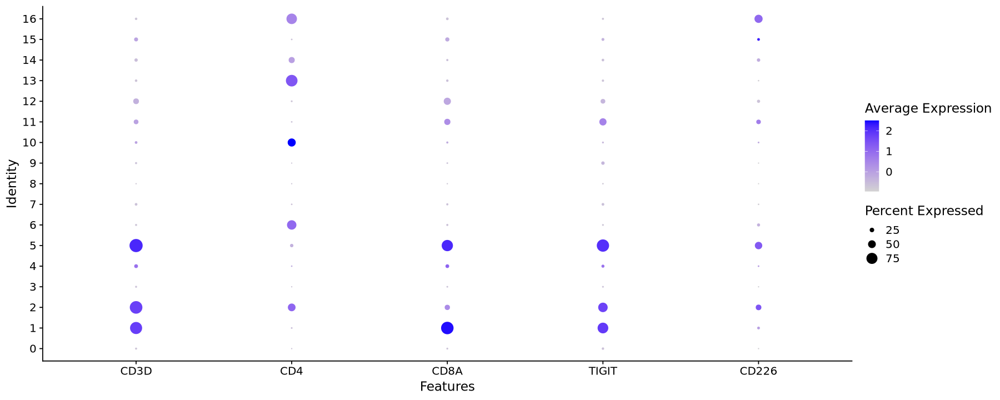

In [12]:
options(repr.plot.height=6, repr.plot.width=15)
DotPlot(MEL, features = c("CD3D", "CD4", "CD8A", "TIGIT", "CD226"))

#### Next part of code is about determining which cluster is the myeloid cells

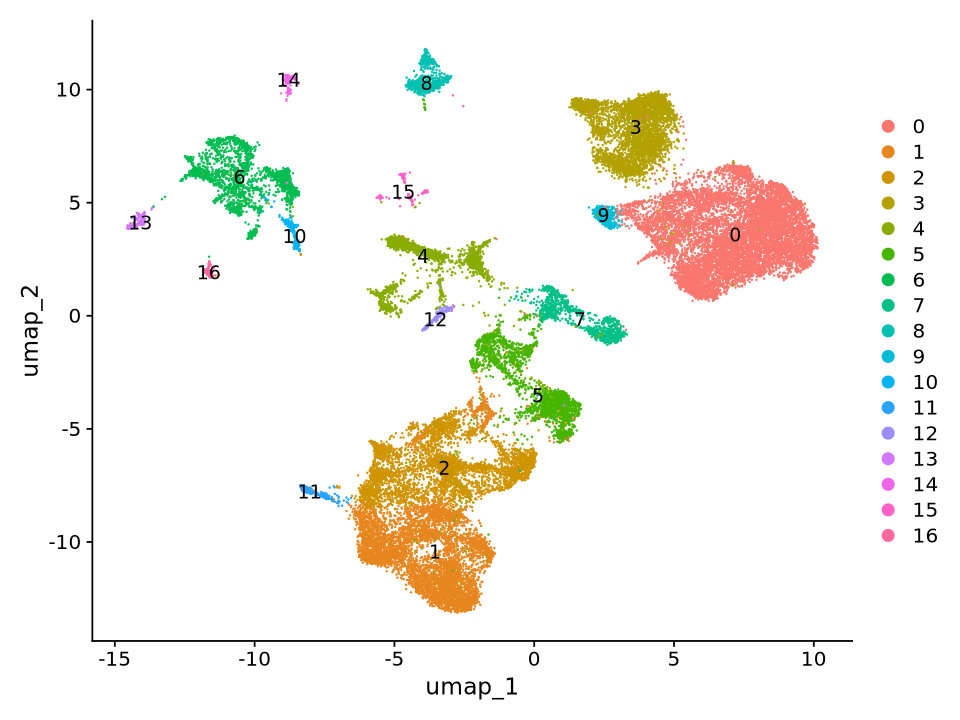

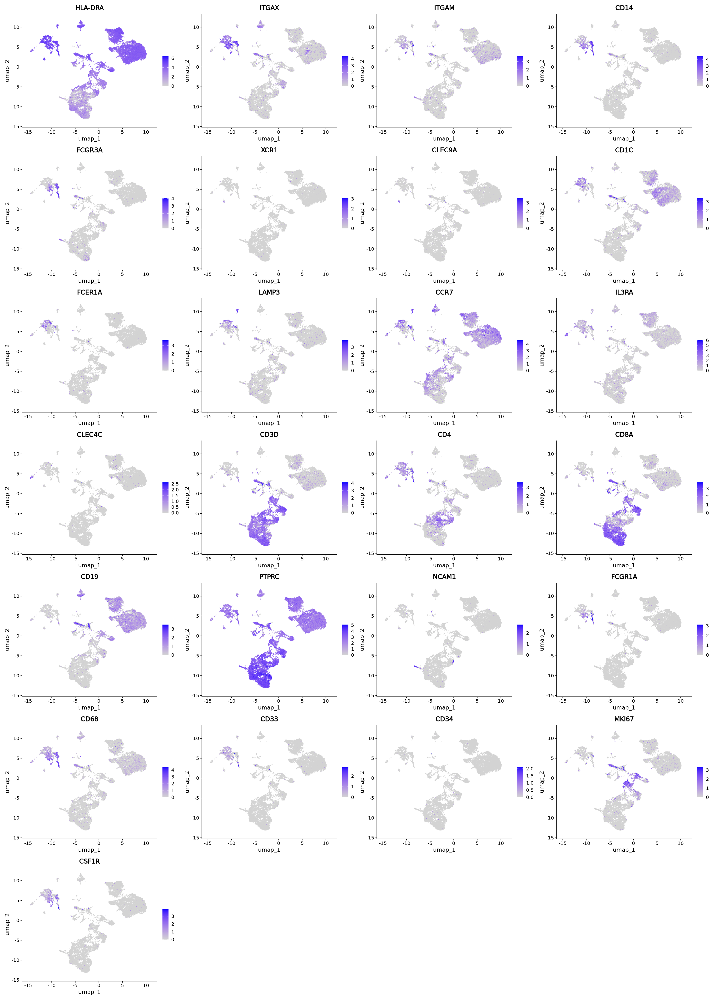

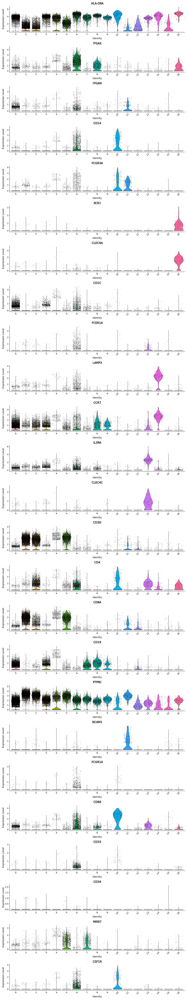

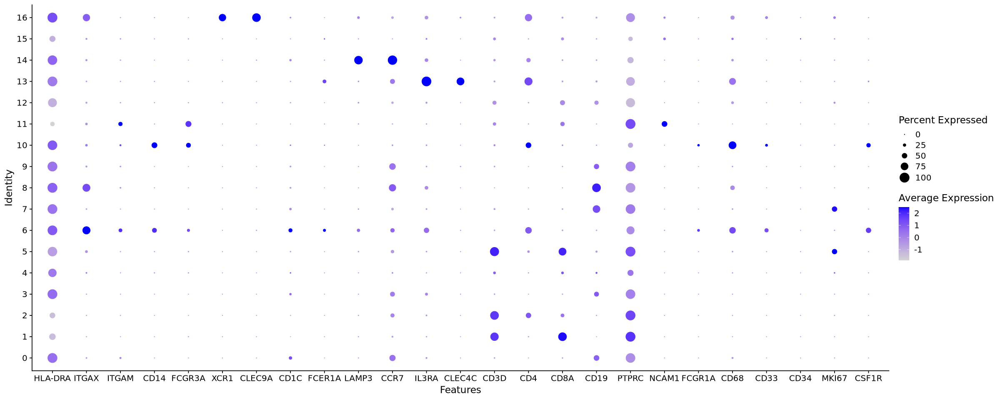

In [31]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(MEL, reduction = "umap", label=TRUE)

options(repr.plot.height=35, repr.plot.width=25)
FeaturePlot(MEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(MEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(MEL, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))

#### From above it looks like clusters 6,10,14,16 are the myeloid cells, now subsetting out these clusters

In [33]:
head(MEL@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
PRJNA907381_MEL022_iLN_AAACCCAAGAAGCTGC-1,PRJNA907381,5669,2148,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,5.944611,1,1
PRJNA907381_MEL022_iLN_AAACCCAAGCCAAGCA-1,PRJNA907381,8226,2412,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,7.196693,2,2
PRJNA907381_MEL022_iLN_AAACCCAAGCTCCACG-1,PRJNA907381,5645,2403,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,4.286980,1,1
PRJNA907381_MEL022_iLN_AAACCCAAGTGGCAGT-1,PRJNA907381,6102,2469,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,2.753196,1,1
PRJNA907381_MEL022_iLN_AAACCCACACTTTATC-1,PRJNA907381,4328,1771,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,3.257856,1,1
PRJNA907381_MEL022_iLN_AAACCCACAGCGTATT-1,PRJNA907381,12226,3481,LN mets,Metastatic Melanoma,MEL022,PRJNA907381_MEL022_iLN,4.016031,1,1


In [34]:
myeloid_MEL <- subset(MEL, subset = RNA_snn_res.0.2 %in% c("6","10","14","16"))

In [35]:
MEL
myeloid_MEL

An object of class Seurat 
36601 features across 33998 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 17 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
36601 features across 2723 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 17 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, scale.data
 2 dimensional reductions calculated: pca, umap

In [36]:
saveRDS(myeloid_MEL, "/scratch/user/s4436039/scdata/PRJNA907381/PRJNA907381_myeloid.RDS")

#### Following the above then need to move entire PRJNA907381 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/PRJNA907381/ /QRISdata/Q5935/nikita/scdata/PRJNA907381

rsync -azvhp /QRISdata/Q5935/nikita/scdata/PRJNA907381/PRJNA907381_myeloid.RDS /scratch/user/s4436039/scdata/PRJNA907381
```